In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

from fastai.conv_learner import *
from fastai.dataset import *

from pathlib import Path
import json

from PIL import ImageDraw, ImageFont
from matplotlib import patches, patheffects

In [2]:
PATH = Path('data/coconut')
list(PATH.iterdir())

[PosixPath('data/coconut/models'),
 PosixPath('data/coconut/tmp'),
 PosixPath('data/coconut/train'),
 PosixPath('data/coconut/bboxes.csv'),
 PosixPath('data/coconut/tilemapping.pkl'),
 PosixPath('data/coconut/classes.csv')]

In [3]:
import pickle
tilemapping = pickle.load(open(PATH/'tilemapping.pkl', 'rb'))
len(tilemapping)

4185

### Drawing code

In [4]:
sz = 224
objsize = 90

def get_bbox(center): # as [ymin, xmin, ymax, xmax]
    xpix, ypix = int(sz*center[0]), int(sz*(1.0-center[1]))
        
    xmin, xmax = xpix - objsize//2, xpix + objsize//2 + 2
    ymin, ymax = ypix - objsize//2, ypix + objsize//2 + 2
    xmin = xmin if xmin > 0 else 0
    ymin = ymin if ymin > 0 else 0
    xmax = xmax if xmax < sz else sz
    ymax = ymax if ymax < sz else sz
    return [ymin, xmin, ymax, xmax]

In [5]:
categories = {0:  'ground', 1:'coconut tree'}

In [295]:
import matplotlib.pyplot as plt

%matplotlib inline

def get_color(text):
    if text=='bg':
        c = 'gray'
    elif text=='coconut tree':
        c = 'white'
    else:
        c = 'yellow'
    return c

def draw_outline(obj, width):
    obj.set_path_effects([patheffects.Stroke(linewidth=width, foreground='black'), patheffects.Normal()])

def draw_bbox(ax, bbox, text=None, i=None, pr=None):    
    c = get_color(text)
    patch = ax.add_patch(patches.Rectangle(xy=(bbox[1], bbox[0]), width=bbox[3]-bbox[1],
                                           height=bbox[2]-bbox[0], 
                                           fill=False, edgecolor=c, lw=2))
    draw_outline(patch, 4)
    if i is not None:
        text = str(i) + ': ' + text
    if pr is not None:
        text = text + f' {pr:.2f}'
    if text is not None:
        t = ax.text(bbox[1], bbox[0], s=text, color='white', fontsize=12,
                    verticalalignment='bottom', weight='bold') #,bbox=dict(facecolor=c, pad=2))
        draw_outline(t, 1)

def draw_img_bboxes(ax, img, bboxes, classes=None, prs=None, thresh=0.3):
    
    if prs is None:  
        prs  = [None]*len(bboxes)
    if classes is None: 
        classes = [1]*len(bboxes)
    
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    ax.imshow(img);
    for i, (bbox, c, pr) in enumerate(zip(bboxes, classes, prs)):
        if((bbox[3] - bbox[1] > 0) and (pr is None or pr > thresh)):
            try: cat = categories[c]
            except: cat = 'bg'
            draw_bbox(ax, bbox, cat, i, pr)
            
def draw_image(filename):
    fig, ax = plt.subplots(figsize=(4,4))
    img = open_image(PATH / 'train' / filename)
    
    bboxes=[]
    for center in tilemapping[filename]:
        bboxes.append(get_bbox(center))
        
    draw_img_bboxes(ax, img, bboxes)

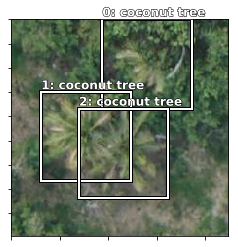

In [192]:
draw_image('coconut2.JPG')

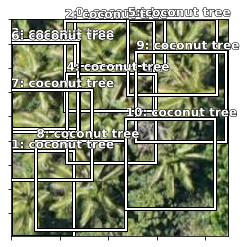

In [193]:
draw_image('coconut5236.JPG')

### Create bboxes csv

In [9]:
def get_bboxes_str(filename):
    bboxes = ''
    for center in tilemapping[filename]:
        bboxes = bboxes + ' '.join(str(c) for c in (get_bbox(center)))
        bboxes = bboxes + ' '
    return bboxes

In [10]:
bboxes_dict = {name: get_bboxes_str(name).strip()
                   for name, centers in tilemapping.items()}

In [11]:
len(bboxes_dict)

4185

In [12]:
bboxes_dict['coconut2.JPG']

'0 94 92 186 75 31 167 123 92 70 184 162'

In [15]:
bboxes_df = pd.DataFrame.from_dict(bboxes_dict, orient='index').reset_index()
bboxes_df.columns = ['fn', 'bbox']

MULTIBOX_CSV = PATH/'bboxes.csv'
bboxes_df.sort_values(by='fn', inplace=True)
bboxes_df.to_csv(MULTIBOX_CSV, index=False)
bboxes_df.head()

,fn,bbox
1,coconut0.JPG,168 81 224 173
0,coconut1.JPG,0 0 51 60
10,coconut10.JPG,5 0 97 80 56 112 148 204
52,coconut100.JPG,174 149 224 224 133 71 224 163 25 55 117 147 0...
406,coconut1000.JPG,28 140 120 224


### Number of objects

In [16]:
bboxes_df['n'] = bboxes_df['bbox'].apply(lambda x: len(x.split(' ')) // 4)

In [17]:
bboxes_df.head()

,fn,bbox,n
1,coconut0.JPG,168 81 224 173,1
0,coconut1.JPG,0 0 51 60,1
10,coconut10.JPG,5 0 97 80 56 112 148 204,2
52,coconut100.JPG,174 149 224 224 133 71 224 163 25 55 117 147 0...,5
406,coconut1000.JPG,28 140 120 224,1


In [18]:
bboxes_df[bboxes_df.n==11]

,fn,bbox,n
2199,coconut5236.JPG,0 66 48 158 136 0 224 65 2 55 94 147 21 0 113 ...,11


In [19]:
object_classes = np.array([np.ones(row['n']).astype(int) for index,row in bboxes_df.iterrows()])

In [20]:
object_classes

array([array([1]), array([1]), array([1, 1]), ..., array([1, 1]), array([1, 1]), array([1, 1, 1, 1])],
      dtype=object)

In [21]:
len(object_classes)

4185

### Create dataset

In [22]:
val_idxs = get_cv_idxs(len(object_classes))
((val_classes, train_classes),) = split_by_idx(val_idxs, object_classes)

In [23]:
model = resnet34
sz = 224
bs = 64
JPEGS = 'train'

In [24]:
aug_tfms = [RandomRotate(3, p=0.5, tfm_y=TfmType.COORD),
            RandomLighting(0.05, 0.5, tfm_y=TfmType.COORD),
            RandomFlip(tfm_y=TfmType.COORD)]

tfms = tfms_from_model(model, sz, crop_type=CropType.NO, tfm_y=TfmType.COORD, aug_tfms=aug_tfms)

model_data = ImageClassifierData.from_csv(PATH, JPEGS, MULTIBOX_CSV, tfms=tfms, continuous=True)

In [25]:
class ConcatLblDataset(Dataset):
    def __init__(self, ds, y2):
        self.ds, self.y2 = ds, y2
        self.sz = ds.sz
        
    def __len__(self):
        return len(self.ds)
    
    def __getitem__(self, i):
        x, y1 = self.ds[i]
        y2 = self.y2[i]
        return (x, (y1, y2)) # y1 is bboxes y2 is classes

In [26]:
train_dataset = ConcatLblDataset(model_data.trn_ds, train_classes)
val_dataset = ConcatLblDataset(model_data.val_ds, val_classes)

model_data.trn_dl.dataset = train_dataset
model_data.val_dl.dataset = val_dataset

In [117]:
x,y = to_np(next(iter(model_data.val_dl)))
x   = model_data.val_ds.ds.denorm(x)

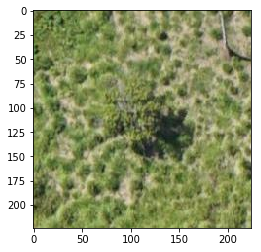

In [118]:
plt.imshow(x[0])

In [119]:
y[0][0].reshape(-1, 4) # bboxes

array([[  0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.],
       [  0., 152.,  82., 222.]], dtype=float32)

In [120]:
y[1][0]

array([0, 0, 0, 0, 0, 1])

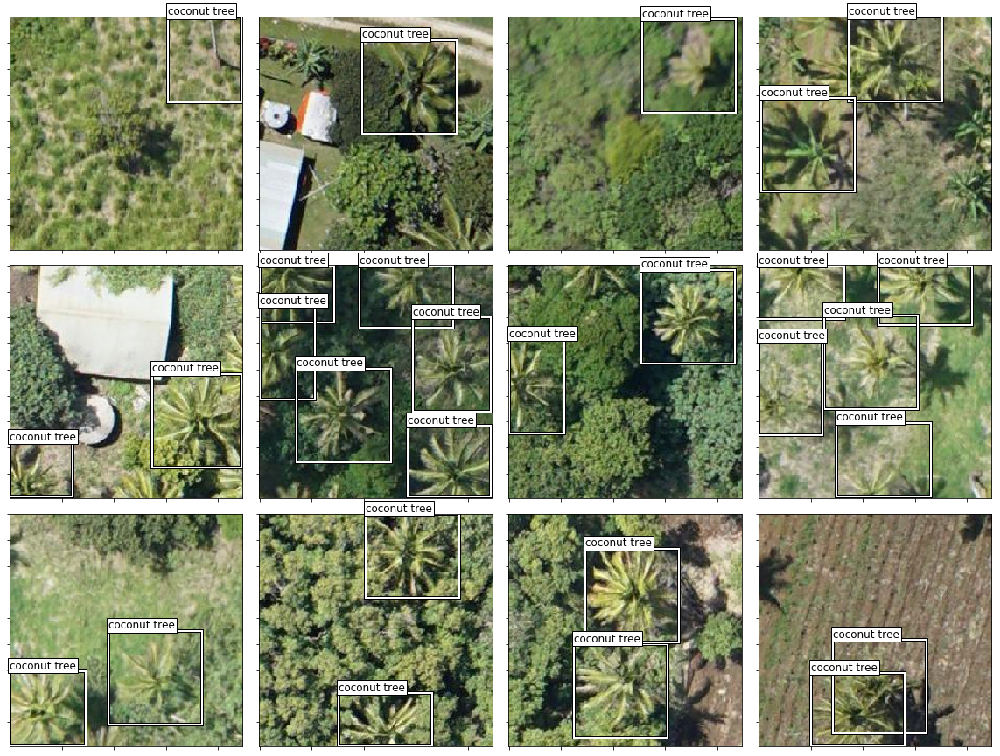

In [121]:
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for i,ax in enumerate(axes.flat):
    draw_img_bboxes(ax, x[i], y[0][i].reshape(-1, 4), y[1][i])
plt.tight_layout()

### Grid model

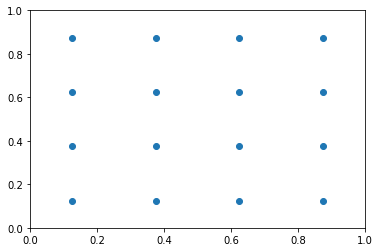

In [32]:
anc_grid = 4
k = 1

anc_offset = 1/(anc_grid*2)
anc_x = np.repeat(np.linspace(anc_offset, 1-anc_offset, anc_grid), anc_grid)
anc_y = np.tile(np.linspace(anc_offset, 1-anc_offset, anc_grid), anc_grid)

anc_ctrs = np.tile(np.stack([anc_x,anc_y], axis=1), (k,1))
anc_sizes = np.array([[1/anc_grid,1/anc_grid] for i in range(anc_grid*anc_grid)])
anchors = V(np.concatenate([anc_ctrs, anc_sizes], axis=1), requires_grad=False).float()

grid_sizes = V(np.array([1/anc_grid]), requires_grad=False).unsqueeze(1)

plt.scatter(anc_x, anc_y)
plt.xlim(0, 1)
plt.ylim(0, 1);

In [33]:
def hw2corners(ctr, hw): return torch.cat([ctr-hw/2, ctr+hw/2], dim=1)

In [34]:
anchor_cnr = hw2corners(anchors[:,:2], anchors[:,2:])
anchor_cnr

Variable containing:
 0.0000  0.0000  0.2500  0.2500
 0.0000  0.2500  0.2500  0.5000
 0.0000  0.5000  0.2500  0.7500
 0.0000  0.7500  0.2500  1.0000
 0.2500  0.0000  0.5000  0.2500
 0.2500  0.2500  0.5000  0.5000
 0.2500  0.5000  0.5000  0.7500
 0.2500  0.7500  0.5000  1.0000
 0.5000  0.0000  0.7500  0.2500
 0.5000  0.2500  0.7500  0.5000
 0.5000  0.5000  0.7500  0.7500
 0.5000  0.7500  0.7500  1.0000
 0.7500  0.0000  1.0000  0.2500
 0.7500  0.2500  1.0000  0.5000
 0.7500  0.5000  1.0000  0.7500
 0.7500  0.7500  1.0000  1.0000
[torch.cuda.FloatTensor of size 16x4 (GPU 0)]

In [35]:
id2cat = list(categories.values())
cat2id = {v:k for k,v in enumerate(id2cat)}

In [36]:
cat2id

{'coconut tree': 1, 'ground': 0}

In [37]:
n_clas = len(id2cat)+1
n_act = k*(4+n_clas)

In [38]:
class StdConv(nn.Module):
    def __init__(self, nin, nout, stride=2, drop=0.1):
        super().__init__()
        self.conv = nn.Conv2d(nin, nout, 3, stride=stride, padding=1)
        self.bn = nn.BatchNorm2d(nout)
        self.drop = nn.Dropout(drop)
        
    def forward(self, x): return self.drop(self.bn(F.relu(self.conv(x))))
        
def flatten_conv(x,k):
    bs,nf,gx,gy = x.size()                # batch size, num filters, width, height
    x = x.permute(0,2,3,1).contiguous()
    return x.view(bs,-1,nf//k)

In [39]:
class OutConv(nn.Module):
    def __init__(self, k, nin, bias):
        super().__init__()
        self.k = k
        self.oconv1 = nn.Conv2d(nin, (len(id2cat)+1)*k, 3, padding=1) # nclasses
        self.oconv2 = nn.Conv2d(nin, 4*k, 3, padding=1) # bboxes
        self.oconv1.bias.data.zero_().add_(bias)
        
    def forward(self, x):
        return [flatten_conv(self.oconv1(x), self.k),
                flatten_conv(self.oconv2(x), self.k)]

In [40]:
f_model = model
md = model_data

In [41]:
class SSD_Head(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(0.25)
        self.sconv0 = StdConv(512,256, stride=1)
#         self.sconv1 = StdConv(256,256)
        self.sconv2 = StdConv(256,256)
        self.out = OutConv(k, 256, bias)
        
    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv0(x)
#         x = self.sconv1(x)
        x = self.sconv2(x)
        return self.out(x)

head_reg4 = SSD_Head(k, -3.)
models = ConvnetBuilder(f_model, 0, 0, 0, custom_head=head_reg4)
learn = ConvLearner(md, models)
learn.opt_fn = optim.Adam
k

1

In [42]:
def one_hot_embedding(labels, num_classes):
    return torch.eye(num_classes)[labels.data.cpu()]

class BCE_Loss(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.num_classes = num_classes

    def forward(self, pred, targ):
        t = one_hot_embedding(targ, self.num_classes+1)
        t = V(t[:,:-1].contiguous())#.cpu()
        x = pred[:,:-1]
        w = self.get_weight(x,t)
        return F.binary_cross_entropy_with_logits(x, t, w, size_average=False)/self.num_classes
    
    def get_weight(self,x,t): return None

loss_f = BCE_Loss(len(id2cat))

In [248]:
def intersect(box_a, box_b):
    max_xy = torch.min(box_a[:, None, 2:], box_b[None, :, 2:])
    min_xy = torch.max(box_a[:, None, :2], box_b[None, :, :2])
    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, :, 0] * inter[:, :, 1]

def box_sz(b): return ((b[:, 2]-b[:, 0]) * (b[:, 3]-b[:, 1]))

def jaccard(box_a, box_b):
    try:
        inter = intersect(box_a, box_b)
        union = box_sz(box_a).unsqueeze(1) + box_sz(box_b).unsqueeze(0) - inter
        return inter / union
    except:
        return 0.

def get_y(bbox,clas):
    bbox = bbox.view(-1,4)/sz
    try:
        xx = ((bbox[:,2]-bbox[:,0])>0).nonzero()
        #print(xx)
        bb_keep = xx[:,0]
    except:
        # print('No bboxes')
        return None, None
    
    #xx = ((bbox[:,2]-bbox[:,0])>0).nonzero()
    #bb_keep = xx[:,0]
    
    return bbox[bb_keep], clas[bb_keep]

def actn_to_bb(actn, anchors):
    actn_bbs = torch.tanh(actn)
    actn_centers = (actn_bbs[:,:2]/2 * grid_sizes) + anchors[:,:2]
    actn_hw = (actn_bbs[:,2:]/2+1) * anchors[:,2:] # [-1, 1]/2 + 1 = [0.5, 1.5] * anchor ht, w
    return hw2corners(actn_centers, actn_hw)

def map_to_ground_truth(overlaps, print_it=False):
    prior_overlap, prior_idx = overlaps.max(1)
    if print_it: print(prior_overlap)
#     pdb.set_trace()
    gt_overlap, gt_idx = overlaps.max(0)
    gt_overlap[prior_idx] = 1.99
    for i,o in enumerate(prior_idx): gt_idx[o] = i
    return gt_overlap,gt_idx

def ssd_1_loss(b_c, b_bb, bbox, clas, print_it=False):
    bbox, clas = get_y(bbox, clas)             # bbox, class from target
    if bbox is None:
        return 0.0, 0.0
    a_ic = actn_to_bb(b_bb, anchors)           # predicted bbox
    overlaps = jaccard(bbox.data, anchor_cnr.data)
    gt_overlap,gt_idx = map_to_ground_truth(overlaps,print_it)
    gt_clas = clas[gt_idx]
    pos = gt_overlap > 0.4
    pos_idx = torch.nonzero(pos)[:,0]
    gt_clas[1-pos] = len(id2cat)
    gt_bbox = bbox[gt_idx]
    loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
    clas_loss  = loss_f(b_c, gt_clas)  # binary cross entropy
    return loc_loss, clas_loss

def ssd_loss(pred, targ, print_it=False):
    lcs, lls = 0.,0. # class loss, location loss
    for b_c, b_bb, bbox, clas in zip(*pred, *targ): 
        loc_loss, clas_loss = ssd_1_loss(b_c, b_bb, bbox, clas, print_it)
        lls += loc_loss
        lcs += clas_loss
    if print_it: print(f'loc: {lls.data[0]}, clas: {lcs.data[0]}')
    return lls+lcs

In [240]:
x,y = next(iter(md.val_dl))
#x,y = V(x).cpu(),V(y)
x,y = V(x),V(y)

In [241]:
for i,o in enumerate(y): 
    y[i] = o.cuda()
learn.model.cuda()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
  (2): ReLU(inplace)
  (3): MaxPool2d(kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), dilation=(1, 1), ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d

In [242]:
batch = learn.model(x)

In [243]:
anchors = anchors.cuda();
grid_sizes = grid_sizes.cuda(); 
anchor_cnr = anchor_cnr.cuda()

In [244]:
ssd_loss(batch, y, True)


 0.5167
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.3872
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.3163
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.4302
 0.3682
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.8708
 0.3896
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.7669
 0.6011
 0.5807
 0.4407
 0.5152
 0.3872
[torch.cuda.FloatTensor of size 6 (GPU 0)]


 0.4892
 0.2933
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.6401
 0.5602
 0.3231
 0.4950
 0.4295
[torch.cuda.FloatTensor of size 5 (GPU 0)]


 0.5711
 0.3872
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.5470
 0.4356
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.2645
 0.3408
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.2578
 0.4783
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.2759
 0.3915
 0.5481
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.5397
 0.2975
 0.8788
 0.5398
[torch.cuda.FloatTensor of size 4 (GPU 0)]


 0.8265
 0.3776
 0.2999
 0.3942
[torch.cuda.FloatTensor of size 4 (GPU 0)]


 0.4113
 0.3

Variable containing:
 174.3864
[torch.cuda.FloatTensor of size 1 (GPU 0)]

In [245]:
learn.crit = ssd_loss
lr = 3e-3
lrs = np.array([lr/100,lr/10,lr])

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

 96%|█████████▌| 51/53 [00:37<00:01,  1.36it/s, loss=3.71e+03]

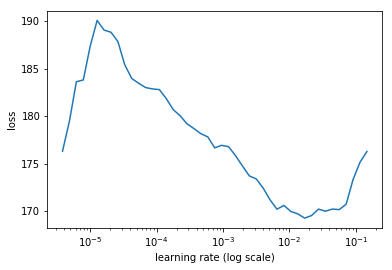

In [246]:
learn.lr_find(lrs/1000,1.)
learn.sched.plot(1)

In [247]:
learn.fit(lr, 1, cycle_len=5, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=5), HTML(value='')))

  6%|▌         | 3/53 [00:06<01:52,  2.26s/it, loss=185]

Exception in thread Thread-9:
Traceback (most recent call last):
  File "/home/rohit/anaconda3/envs/fastai/lib/python3.6/threading.py", line 916, in _bootstrap_inner
    self.run()
  File "/home/rohit/anaconda3/envs/fastai/lib/python3.6/site-packages/tqdm/_tqdm.py", line 144, in run
    for instance in self.tqdm_cls._instances:
  File "/home/rohit/anaconda3/envs/fastai/lib/python3.6/_weakrefset.py", line 60, in __iter__
    for itemref in self.data:
RuntimeError: Set changed size during iteration



 92%|█████████▏| 49/53 [00:35<00:02,  1.39it/s, loss=148]No bboxes
No bboxes                                                
epoch      trn_loss   val_loss   
    0      143.272109 120.73074 
 47%|████▋     | 25/53 [00:23<00:26,  1.05it/s, loss=138]No bboxes
No bboxes                                                
    1      131.511092 114.279832
  4%|▍         | 2/53 [00:05<02:17,  2.70s/it, loss=131]No bboxes
No bboxes
 96%|█████████▌| 51/53 [00:36<00:01,  1.39it/s, loss=127]No bboxes
No bboxes                                                
    2      125.489045 113.071354
 42%|████▏     | 22/53 [00:22<00:31,  1.00s/it, loss=124]No bboxes
No bboxes                                                
    3      120.586769 109.322414
 91%|█████████ | 48/53 [00:34<00:03,  1.37it/s, loss=116]No bboxes
No bboxes                                                
    4      113.983538 107.436287



[107.43628716468811]

In [249]:
learn.fit(lr, 1, cycle_len=5, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=5), HTML(value='')))

epoch      trn_loss   val_loss                           
    0      122.769604 118.176935
    1      120.625169 113.075338                         
    2      117.180812 111.070617                         
    3      111.806312 107.28072                          
    4      107.698686 107.141653                         



[107.14165268625531]

### Testing

In [250]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)        # input in x, ground truth in y
learn.model.eval()
batch = learn.model(x) # activations for the minibatch
b_clas, b_bb = batch   # returned by OutConv

In [251]:
b_clas.size() # (64) batch_size * 16 gridcells * (2+1) num classes + background 

torch.Size([64, 16, 3])

In [252]:
b_bb.size() # (64) batch_size * 16 gridcells * 4 bbox coordinates 

torch.Size([64, 16, 4])

In [253]:
idx=6
b_clasi = b_clas[idx]
b_bboxi = b_bb[idx]

ima = md.val_ds.ds.denorm(to_np(x))[idx]

In [254]:
bbox, clas = get_y(y[0][idx], y[1][idx]) # bboxes, classes from concat dataset
bbox, clas

(Variable containing:
  0.3170  0.0000  0.7188  0.2366
  0.0179  0.5670  0.4196  0.9688
 [torch.cuda.FloatTensor of size 2x4 (GPU 0)], Variable containing:
  1
  1
 [torch.cuda.LongTensor of size 2 (GPU 0)])

In [255]:
def draw_torch_img(ax, ima, bbox, clas, prs=None, thresh=0.4):
    return draw_img_bboxes(ax, ima, to_np((bbox*224).long()),
         to_np(clas), to_np(prs) if prs is not None else None, thresh)

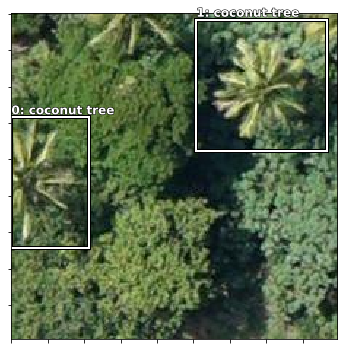

In [256]:
fig, ax = plt.subplots(figsize=(6,6))
draw_torch_img(ax, ima, bbox, clas)

In [257]:
to_np(b_clasi.max(1)[1])

array([2, 1, 1, 1, 1, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2])

In [258]:
categories

{0: 'ground', 1: 'coconut tree'}

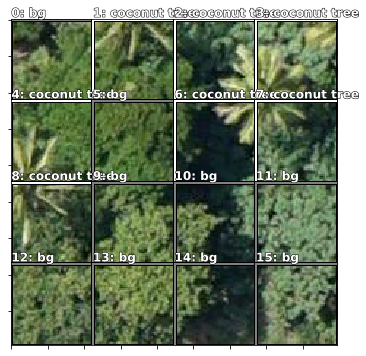

In [259]:
fig, ax = plt.subplots(figsize=(6,6))
draw_torch_img(ax, ima, anchor_cnr, b_clasi.max(1)[1])

### Find overlap between predictions and anchor boxes

In [260]:
anchors

Variable containing:
 0.1250  0.1250  0.2500  0.2500
 0.1250  0.3750  0.2500  0.2500
 0.1250  0.6250  0.2500  0.2500
 0.1250  0.8750  0.2500  0.2500
 0.3750  0.1250  0.2500  0.2500
 0.3750  0.3750  0.2500  0.2500
 0.3750  0.6250  0.2500  0.2500
 0.3750  0.8750  0.2500  0.2500
 0.6250  0.1250  0.2500  0.2500
 0.6250  0.3750  0.2500  0.2500
 0.6250  0.6250  0.2500  0.2500
 0.6250  0.8750  0.2500  0.2500
 0.8750  0.1250  0.2500  0.2500
 0.8750  0.3750  0.2500  0.2500
 0.8750  0.6250  0.2500  0.2500
 0.8750  0.8750  0.2500  0.2500
[torch.cuda.FloatTensor of size 16x4 (GPU 0)]

In [261]:
grid_sizes

Variable containing:
 0.2500
[torch.cuda.FloatTensor of size 1x1 (GPU 0)]

In [262]:
a_ic = actn_to_bb(b_bboxi, anchors)

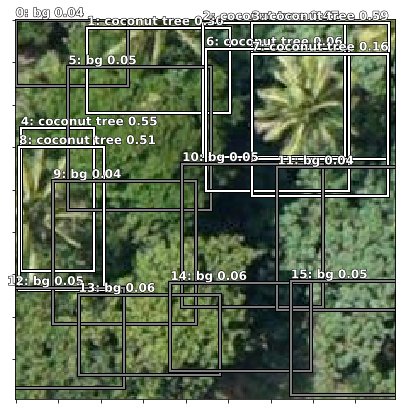

In [263]:
fig, ax = plt.subplots(figsize=(7,7))
draw_torch_img(ax, ima, a_ic, b_clasi.max(1)[1], b_clasi.max(1)[0].sigmoid(), thresh=0.0)

In [264]:
bbox.data


 0.3170  0.0000  0.7188  0.2366
 0.0179  0.5670  0.4196  0.9688
[torch.cuda.FloatTensor of size 2x4 (GPU 0)]

In [265]:
anchor_cnr.data


 0.0000  0.0000  0.2500  0.2500
 0.0000  0.2500  0.2500  0.5000
 0.0000  0.5000  0.2500  0.7500
 0.0000  0.7500  0.2500  1.0000
 0.2500  0.0000  0.5000  0.2500
 0.2500  0.2500  0.5000  0.5000
 0.2500  0.5000  0.5000  0.7500
 0.2500  0.7500  0.5000  1.0000
 0.5000  0.0000  0.7500  0.2500
 0.5000  0.2500  0.7500  0.5000
 0.5000  0.5000  0.7500  0.7500
 0.5000  0.7500  0.7500  1.0000
 0.7500  0.0000  1.0000  0.2500
 0.7500  0.2500  1.0000  0.5000
 0.7500  0.5000  1.0000  0.7500
 0.7500  0.7500  1.0000  1.0000
[torch.cuda.FloatTensor of size 16x4 (GPU 0)]

In [266]:
overlaps = jaccard(bbox.data, anchor_cnr.data)
overlaps # 16 anchor boxes * 2 objects in ground truth



Columns 0 to 9 
 0.0000  0.0000  0.0000  0.0000  0.3790  0.0000  0.0000  0.0000  0.4892  0.0000
 0.0000  0.0000  0.2342  0.2933  0.0000  0.0000  0.1610  0.1986  0.0000  0.0000

Columns 10 to 15 
 0.0000  0.0000  0.0000  0.0000  0.0000  0.0000
 0.0000  0.0000  0.0000  0.0000  0.0000  0.0000
[torch.cuda.FloatTensor of size 2x16 (GPU 0)]

In [267]:
overlaps.max(1) # which anchor box does each ground truth maximally overlap with?

(
  0.4892
  0.2933
 [torch.cuda.FloatTensor of size 2 (GPU 0)], 
  8
  3
 [torch.cuda.LongTensor of size 2 (GPU 0)])

In [268]:
overlaps.max(0) # max amt of overlap for each grid cell with any ground truth object, and which one
                # index 0 can mean object index 0 has max overlap or overlap is 0 - bbox 4 had max overlap (0.379)
                # with 1st(0 index) object

(
  0.0000
  0.0000
  0.2342
  0.2933
  0.3790
  0.0000
  0.1610
  0.1986
  0.4892
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
 [torch.cuda.FloatTensor of size 16 (GPU 0)], 
  0
  0
  1
  1
  0
  0
  1
  1
  0
  0
  0
  0
  0
  0
  0
  0
 [torch.cuda.LongTensor of size 16 (GPU 0)])

### Overlap results:
* Object 0 overlaps with 8th anchor box the most
* Object 1 overlaps with 3rd anchor box the most

* anchor boxes 2, 3, 6, 7 maximally overlap with ground truth object 1, but not more than 0.5
* anchor boxes 4 & 8 maximally overlap with object 0, but not more than 0.5

### Mapping to ground truth
* For each object in ground truth, assign anchor box of max overlap to it - overlaps.max(1) 
* For each anchor box, if overlap with object > 0.5: - overlaps.max(0) 
    * assign anchor box to that object
    * else, assign anchor box to background class

In [269]:
def map_to_ground_truth(overlaps, print_it=False):
    prior_overlap, prior_idx = overlaps.max(1)

    gt_overlap, gt_idx = overlaps.max(0)
    gt_overlap[prior_idx] = 1.99
    for i,o in enumerate(prior_idx): 
        gt_idx[o] = i
    return gt_overlap, gt_idx

In [270]:
overlaps.max(0)

(
  0.0000
  0.0000
  0.2342
  0.2933
  0.3790
  0.0000
  0.1610
  0.1986
  0.4892
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
 [torch.cuda.FloatTensor of size 16 (GPU 0)], 
  0
  0
  1
  1
  0
  0
  1
  1
  0
  0
  0
  0
  0
  0
  0
  0
 [torch.cuda.LongTensor of size 16 (GPU 0)])

In [271]:
gt_overlap, gt_idx = map_to_ground_truth(overlaps)
gt_overlap, gt_idx

(
  0.0000
  0.0000
  0.2342
  1.9900
  0.3790
  0.0000
  0.1610
  0.1986
  1.9900
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
 [torch.cuda.FloatTensor of size 16 (GPU 0)], 
  0
  0
  1
  1
  0
  0
  1
  1
  0
  0
  0
  0
  0
  0
  0
  0
 [torch.cuda.LongTensor of size 16 (GPU 0)])

In [272]:
clas

Variable containing:
 1
 1
[torch.cuda.LongTensor of size 2 (GPU 0)]

In [273]:
gt_clas = clas[gt_idx]; gt_clas

Variable containing:
 1
 1
 1
 1
 1
 1
 1
 1
 1
 1
 1
 1
 1
 1
 1
 1
[torch.cuda.LongTensor of size 16 (GPU 0)]

In [274]:
thresh = 0.5
pos = gt_overlap > thresh
pos_idx = torch.nonzero(pos)[:,0]
neg_idx = torch.nonzero(1-pos)[:,0]
pos_idx


 3
 8
[torch.cuda.LongTensor of size 2 (GPU 0)]

In [275]:
gt_clas[1-pos] = len(id2cat)
[id2cat[o] if o<len(id2cat) else 'bg' for o in gt_clas.data]

['bg',
 'bg',
 'bg',
 'coconut tree',
 'bg',
 'bg',
 'bg',
 'bg',
 'coconut tree',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg']

In [276]:
gt_idx


 0
 0
 1
 1
 0
 0
 1
 1
 0
 0
 0
 0
 0
 0
 0
 0
[torch.cuda.LongTensor of size 16 (GPU 0)]

In [277]:
bbox # ground truth bboxes

Variable containing:
 0.3170  0.0000  0.7188  0.2366
 0.0179  0.5670  0.4196  0.9688
[torch.cuda.FloatTensor of size 2x4 (GPU 0)]

In [278]:
gt_bbox = bbox[gt_idx] # ground thuth bbox of objects where they match
gt_bbox

Variable containing:
 0.3170  0.0000  0.7188  0.2366
 0.3170  0.0000  0.7188  0.2366
 0.0179  0.5670  0.4196  0.9688
 0.0179  0.5670  0.4196  0.9688
 0.3170  0.0000  0.7188  0.2366
 0.3170  0.0000  0.7188  0.2366
 0.0179  0.5670  0.4196  0.9688
 0.0179  0.5670  0.4196  0.9688
 0.3170  0.0000  0.7188  0.2366
 0.3170  0.0000  0.7188  0.2366
 0.3170  0.0000  0.7188  0.2366
 0.3170  0.0000  0.7188  0.2366
 0.3170  0.0000  0.7188  0.2366
 0.3170  0.0000  0.7188  0.2366
 0.3170  0.0000  0.7188  0.2366
 0.3170  0.0000  0.7188  0.2366
[torch.cuda.FloatTensor of size 16x4 (GPU 0)]

In [279]:
gt_bbox[pos_idx]

Variable containing:
 0.0179  0.5670  0.4196  0.9688
 0.3170  0.0000  0.7188  0.2366
[torch.cuda.FloatTensor of size 2x4 (GPU 0)]

In [280]:
(a_ic[pos_idx] - gt_bbox[pos_idx]).abs().mean()

Variable containing:
1.00000e-02 *
  2.1389
[torch.cuda.FloatTensor of size 1 (GPU 0)]

In [281]:

loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
clas_loss  = F.cross_entropy(b_clasi, gt_clas)
loc_loss,clas_loss

(Variable containing:
 1.00000e-02 *
   2.1389
 [torch.cuda.FloatTensor of size 1 (GPU 0)], Variable containing:
  0.7199
 [torch.cuda.FloatTensor of size 1 (GPU 0)])

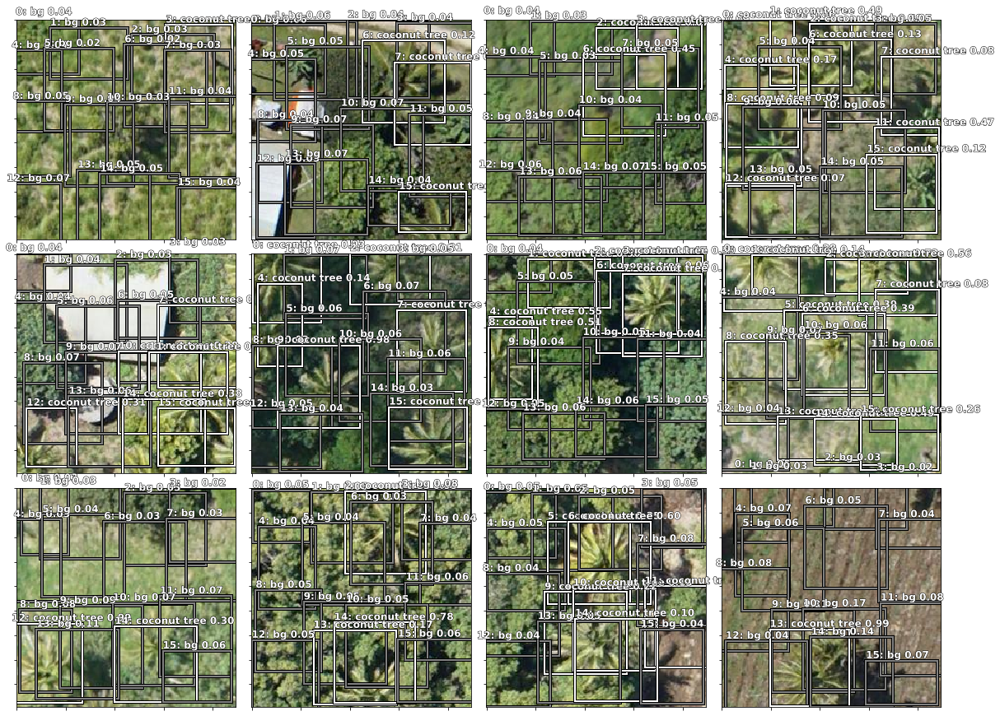

In [282]:
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for idx,ax in enumerate(axes.flat):
    ima=md.val_ds.ds.denorm(to_np(x))[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    ima=md.val_ds.ds.denorm(to_np(x))[idx]
    bbox,clas = get_y(bbox,clas); bbox,clas
    a_ic = actn_to_bb(b_bb[idx], anchors)
    draw_torch_img(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.01)
plt.tight_layout()

In [283]:
learn.save('k1')

### More anchors

In [284]:
anc_grids = [4,2,1]
# anc_grids = [2]
anc_zooms = [0.7, 1., 1.3]
# anc_zooms = [1.]
anc_ratios = [(1.,1.), (1.,0.5), (0.5,1.)]
# anc_ratios = [(1.,1.)]
anchor_scales = [(anz*i,anz*j) for anz in anc_zooms for (i,j) in anc_ratios]
k = len(anchor_scales)
anc_offsets = [1/(o*2) for o in anc_grids]
k

9

In [285]:
anc_x = np.concatenate([np.repeat(np.linspace(ao, 1-ao, ag), ag)
                        for ao,ag in zip(anc_offsets,anc_grids)])
anc_y = np.concatenate([np.tile(np.linspace(ao, 1-ao, ag), ag)
                        for ao,ag in zip(anc_offsets,anc_grids)])
anc_ctrs = np.repeat(np.stack([anc_x,anc_y], axis=1), k, axis=0)

In [286]:
anc_sizes  =   np.concatenate([np.array([[o/ag,p/ag] for i in range(ag*ag) for o,p in anchor_scales])
               for ag in anc_grids])
grid_sizes = V(np.concatenate([np.array([ 1/ag       for i in range(ag*ag) for o,p in anchor_scales])
               for ag in anc_grids]), requires_grad=False).unsqueeze(1)
anchors = V(np.concatenate([anc_ctrs, anc_sizes], axis=1), requires_grad=False).float()
anchor_cnr = hw2corners(anchors[:,:2], anchors[:,2:])

In [287]:
x,y=to_np(next(iter(md.val_dl)))
x=md.val_ds.ds.denorm(x)

In [288]:
a=np.reshape((to_np(anchor_cnr) + to_np(torch.randn(*anchor_cnr.size()))*0.01)*224, -1)

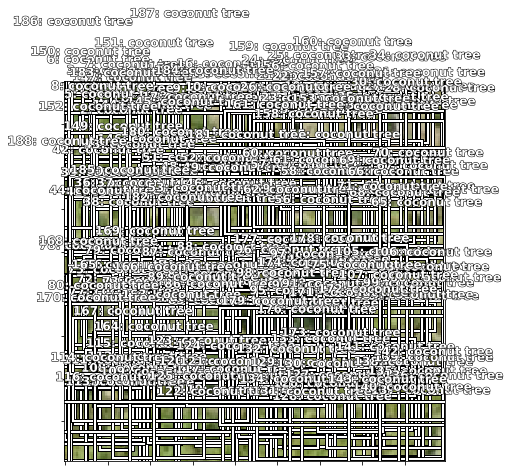

In [296]:
fig, ax = plt.subplots(figsize=(7,7))
draw_img_bboxes(ax, x[0], a.reshape(-1,4))

In [297]:
len(a.reshape(-1,4))

189

### Model

In [298]:
drop=0.4

class SSD_MultiHead(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(drop)
        self.sconv0 = StdConv(512,256, stride=1, drop=drop)
        self.sconv1 = StdConv(256,256, drop=drop)
        self.sconv2 = StdConv(256,256, drop=drop)
        self.sconv3 = StdConv(256,256, drop=drop)
        self.out0 = OutConv(k, 256, bias)
        self.out1 = OutConv(k, 256, bias)
        self.out2 = OutConv(k, 256, bias)
        self.out3 = OutConv(k, 256, bias)

    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv0(x)
        x = self.sconv1(x)
        o1c,o1l = self.out1(x)
        x = self.sconv2(x)
        o2c,o2l = self.out2(x)
        x = self.sconv3(x)
        o3c,o3l = self.out3(x)
        return [torch.cat([o1c,o2c,o3c], dim=1),
                torch.cat([o1l,o2l,o3l], dim=1)]

head_reg4 = SSD_MultiHead(k, -4.)
models = ConvnetBuilder(f_model, 0, 0, 0, custom_head=head_reg4)
learn = ConvLearner(md, models)
learn.opt_fn = optim.Adam

In [299]:
learn.crit = ssd_loss
lr = 1e-2
lrs = np.array([lr/100,lr/10,lr])

In [300]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
batch = learn.model(V(x))

In [302]:
batch[0].size(), batch[1].size()

(torch.Size([64, 189, 3]), torch.Size([64, 189, 4]))

In [303]:
k

9

In [304]:
ssd_loss(batch, y, True)

loc: 5.739034175872803, clas: 1375.11767578125


Variable containing:
 1380.8567
[torch.cuda.FloatTensor of size 1 (GPU 0)]

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

 96%|█████████▌| 51/53 [00:38<00:01,  1.34it/s, loss=1.09e+04]

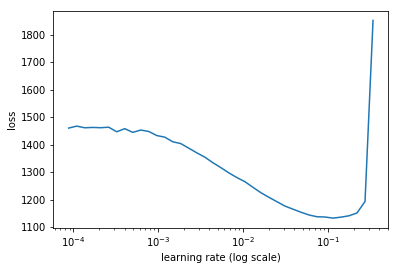

In [305]:
learn.lr_find(lrs/1000,1.)
learn.sched.plot(n_skip_end=2)

In [306]:
lrs

array([0.0001, 0.001 , 0.01  ])

In [307]:
learn.fit(lrs, 1, cycle_len=4, use_clr=(20,8))

HBox(children=(IntProgress(value=0, description='Epoch', max=4), HTML(value='')))

  6%|▌         | 3/53 [00:07<01:58,  2.37s/it, loss=1.49e+03] 


Exception in thread Thread-20:
Traceback (most recent call last):
  File "/home/rohit/anaconda3/envs/fastai/lib/python3.6/threading.py", line 916, in _bootstrap_inner
    self.run()
  File "/home/rohit/anaconda3/envs/fastai/lib/python3.6/site-packages/tqdm/_tqdm.py", line 144, in run
    for instance in self.tqdm_cls._instances:
  File "/home/rohit/anaconda3/envs/fastai/lib/python3.6/_weakrefset.py", line 60, in __iter__
    for itemref in self.data:
RuntimeError: Set changed size during iteration



epoch      trn_loss   val_loss                                
    0      791.254506 595.544208
    1      685.68176  544.252079                         
    2      634.285783 518.506944                         
    3      596.286694 503.205031                         



[503.2050312587193]

In [308]:
learn.fit(lrs, 1, cycle_len=4, use_clr=(20,8))

HBox(children=(IntProgress(value=0, description='Epoch', max=4), HTML(value='')))

epoch      trn_loss   val_loss                           
    0      619.352702 554.802119
    1      615.555655 514.797888                         
    2      588.558286 502.538327                         
    3      567.544906 485.31385                          



[485.31385026659285]

In [309]:
learn.save('tmpmulti')

In [310]:
learn.freeze_to(-2)
learn.fit(lrs/2, 1, cycle_len=4, use_clr=(20,8))

HBox(children=(IntProgress(value=0, description='Epoch', max=4), HTML(value='')))

epoch      trn_loss   val_loss                           
    0      511.047695 419.4727  
    1      455.733828 394.097582                         
    2      411.795407 388.228717                         
    3      373.048031 390.402393                         



[390.40239313670565]

In [312]:
learn.fit(lrs/2, 1, cycle_len=4, use_clr=(20,8))

HBox(children=(IntProgress(value=0, description='Epoch', max=4), HTML(value='')))

epoch      trn_loss   val_loss                           
    0      392.81578  438.429714
    1      385.683865 396.128008                         
    2      347.306087 419.661446                         
    3      302.318789 417.805482                         



[417.80548245566234]

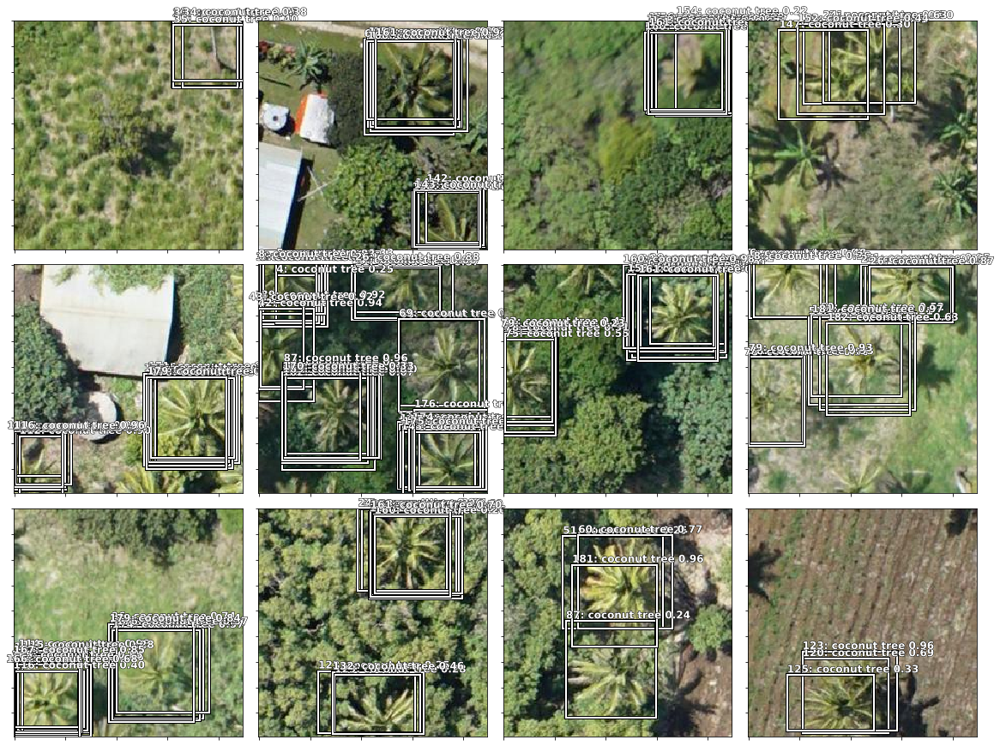

In [317]:
x,y = next(iter(md.val_dl))
y = V(y)
batch = learn.model(V(x))
b_clas,b_bb = batch
x = to_np(x)

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for idx,ax in enumerate(axes.flat):
    ima=md.val_ds.ds.denorm(x)[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    a_ic = actn_to_bb(b_bb[idx], anchors)
    draw_torch_img(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.21)
plt.tight_layout()

### Focal Loss

In [318]:
def plot_results(thresh):
    x,y = next(iter(md.val_dl))
    y = V(y)
    batch = learn.model(V(x))
    b_clas,b_bb = batch

    x = to_np(x)
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    for idx,ax in enumerate(axes.flat):
        ima=md.val_ds.ds.denorm(x)[idx]
        bbox,clas = get_y(y[0][idx], y[1][idx])
        a_ic = actn_to_bb(b_bb[idx], anchors)
        clas_pr, clas_ids = b_clas[idx].max(1)
        clas_pr = clas_pr.sigmoid()
        draw_torch_img(ax, ima, a_ic, clas_ids, clas_pr, clas_pr.max().data[0]*thresh)
    plt.tight_layout()

In [319]:
class FocalLoss(BCE_Loss):
    def get_weight(self,x,t):
        alpha,gamma = 0.25,1
        p = x.sigmoid()
        pt = p*t + (1-p)*(1-t)
        w = alpha*t + (1-alpha)*(1-t)
        return w * (1-pt).pow(gamma)

loss_f = FocalLoss(len(id2cat))

In [320]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
batch = learn.model(x)
ssd_loss(batch, y, True)

loc: 2.0177817344665527, clas: 140.79664611816406


Variable containing:
 142.8144
[torch.cuda.FloatTensor of size 1 (GPU 0)]

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

 91%|█████████ | 48/53 [00:51<00:05,  1.07s/it, loss=316] 

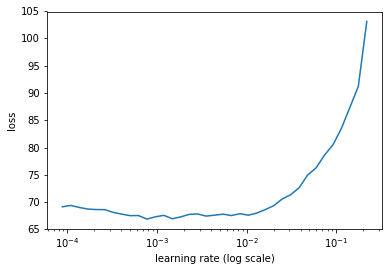

In [321]:
learn.lr_find(lrs/1000,1.)
learn.sched.plot(n_skip_end=1)

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

  2%|▏         | 1/53 [00:03<03:15,  3.75s/it, loss=73.8]


Exception in thread Thread-40:
Traceback (most recent call last):
  File "/home/rohit/anaconda3/envs/fastai/lib/python3.6/threading.py", line 916, in _bootstrap_inner
    self.run()
  File "/home/rohit/anaconda3/envs/fastai/lib/python3.6/site-packages/tqdm/_tqdm.py", line 144, in run
    for instance in self.tqdm_cls._instances:
  File "/home/rohit/anaconda3/envs/fastai/lib/python3.6/_weakrefset.py", line 60, in __iter__
    for itemref in self.data:
RuntimeError: Set changed size during iteration



 89%|████████▊ | 47/53 [00:50<00:06,  1.08s/it, loss=1.79e+03]


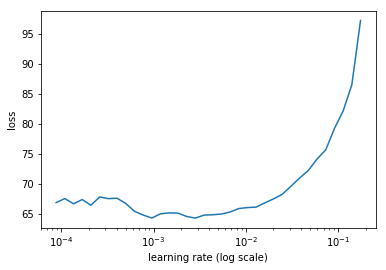

In [322]:
learn.lr_find(lrs/1000,1.)
learn.sched.plot(n_skip_end=1)

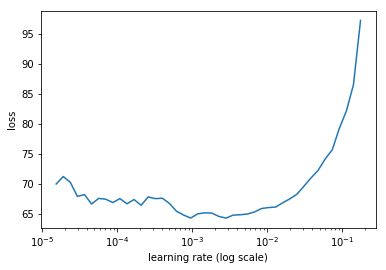

In [323]:
learn.sched.plot(2, 1)

In [324]:
lrs

array([0.0001, 0.001 , 0.01  ])

In [325]:
learn.fit(lrs/10, 1, cycle_len=10, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

epoch      trn_loss   val_loss                                
    0      59.318028  101.046408
    1      54.889479  99.047875                           
    2      50.235123  99.727686                           
    3      46.380321  103.09836                           
    4      43.669216  102.901394                          
    5      40.957106  107.247421                          
    6      39.459329  108.966272                          
    7      37.470466  108.408468                          
    8      36.150495  108.483196                          
    9      34.699506  110.844893                          



[110.8448930808476]

In [326]:
learn.freeze_to(-2)
learn.fit(lrs/30, 1, cycle_len=4, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=4), HTML(value='')))

epoch      trn_loss   val_loss                            
    0      33.459309  113.063739
    1      33.605126  114.537425                          
    2      32.424786  114.745957                          
    3      31.597178  115.293279                          



[115.29327852385384]

In [327]:
learn.save('drop')

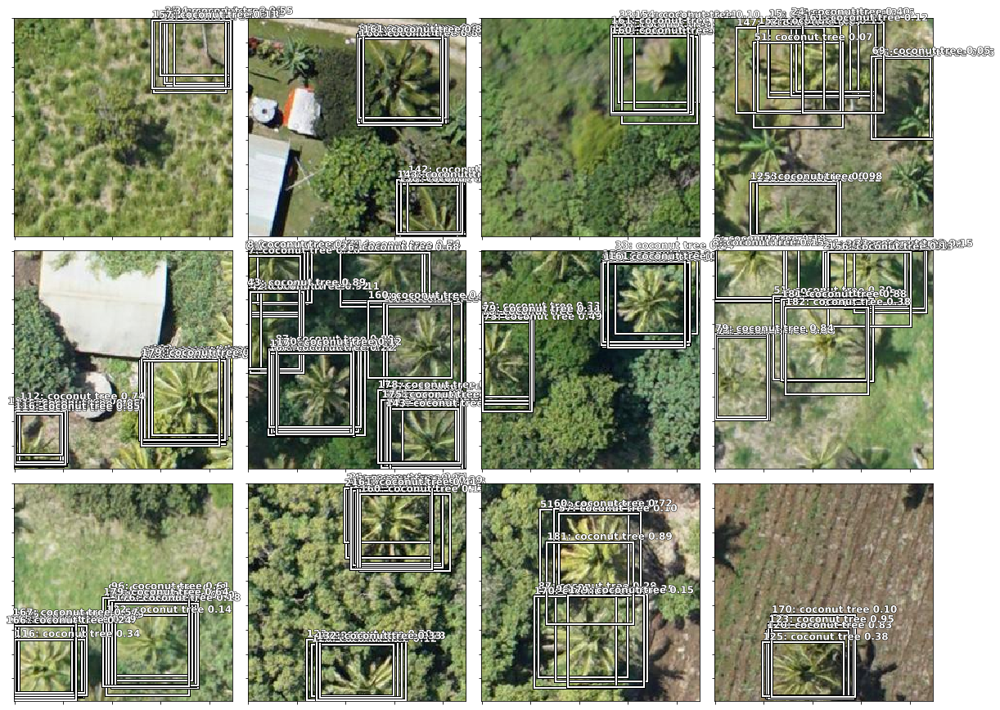

In [331]:
plot_results(0.1)

### Non maximal suppression

In [332]:
def nms(boxes, scores, overlap=0.5, top_k=100):
    keep = scores.new(scores.size(0)).zero_().long()
    if boxes.numel() == 0: return keep
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]
    area = torch.mul(x2 - x1, y2 - y1)
    v, idx = scores.sort(0)  # sort in ascending order
    idx = idx[-top_k:]  # indices of the top-k largest vals
    xx1 = boxes.new()
    yy1 = boxes.new()
    xx2 = boxes.new()
    yy2 = boxes.new()
    w = boxes.new()
    h = boxes.new()

    count = 0
    while idx.numel() > 0:
        i = idx[-1]  # index of current largest val
        keep[count] = i
        count += 1
        if idx.size(0) == 1: break
        idx = idx[:-1]  # remove kept element from view
        # load bboxes of next highest vals
        torch.index_select(x1, 0, idx, out=xx1)
        torch.index_select(y1, 0, idx, out=yy1)
        torch.index_select(x2, 0, idx, out=xx2)
        torch.index_select(y2, 0, idx, out=yy2)
        # store element-wise max with next highest score
        xx1 = torch.clamp(xx1, min=x1[i])
        yy1 = torch.clamp(yy1, min=y1[i])
        xx2 = torch.clamp(xx2, max=x2[i])
        yy2 = torch.clamp(yy2, max=y2[i])
        w.resize_as_(xx2)
        h.resize_as_(yy2)
        w = xx2 - xx1
        h = yy2 - yy1
        # check sizes of xx1 and xx2.. after each iteration
        w = torch.clamp(w, min=0.0)
        h = torch.clamp(h, min=0.0)
        inter = w*h
        # IoU = i / (area(a) + area(b) - i)
        rem_areas = torch.index_select(area, 0, idx)  # load remaining areas)
        union = (rem_areas - inter) + area[i]
        IoU = inter/union  # store result in iou
        # keep only elements with an IoU <= overlap
        idx = idx[IoU.le(overlap)]
    return keep, count

In [333]:
x,y = next(iter(md.val_dl))
y = V(y)
batch = learn.model(V(x))
b_clas,b_bb = batch
x = to_np(x)

In [335]:
def show_nmf(idx):
    ima=md.val_ds.ds.denorm(x)[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    a_ic = actn_to_bb(b_bb[idx], anchors)
    clas_pr, clas_ids = b_clas[idx].max(1)
    clas_pr = clas_pr.sigmoid()

    conf_scores = b_clas[idx].sigmoid().t().data

    out1,out2,cc = [],[],[]
    for cl in range(0, len(conf_scores)-1):
        c_mask = conf_scores[cl] > 0.25
        if c_mask.sum() == 0: continue
        scores = conf_scores[cl][c_mask]
        l_mask = c_mask.unsqueeze(1).expand_as(a_ic)
        boxes = a_ic[l_mask].view(-1, 4)
        ids, count = nms(boxes.data, scores, 0.4, 50)
        ids = ids[:count]
        out1.append(scores[ids])
        out2.append(boxes.data[ids])
        cc.append([cl]*count)
    cc = T(np.concatenate(cc))
    out1 = torch.cat(out1)
    out2 = torch.cat(out2)

    fig, ax = plt.subplots(figsize=(8,8))
    draw_torch_img(ax, ima, out2, cc, out1, 0.1)

/home/rohit/anaconda3/envs/fastai/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


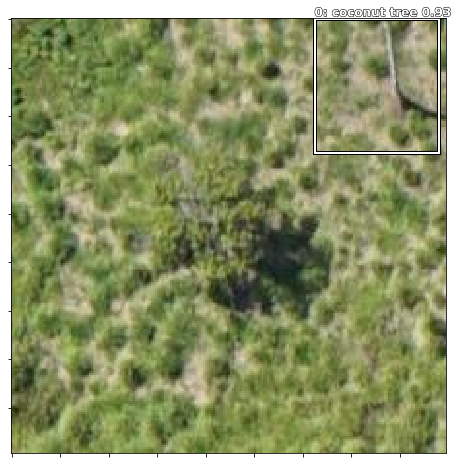

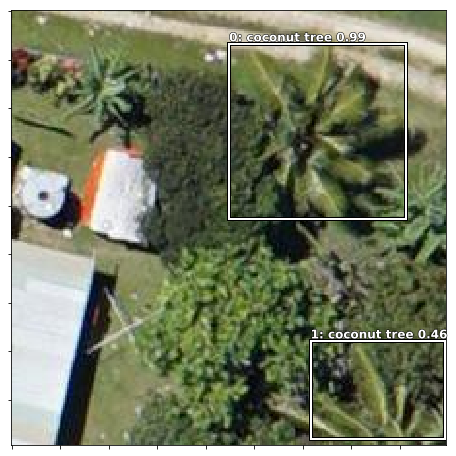

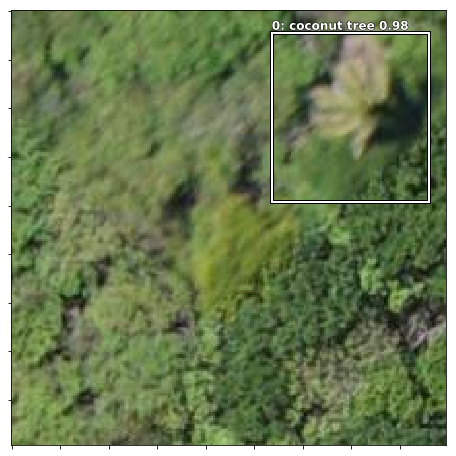

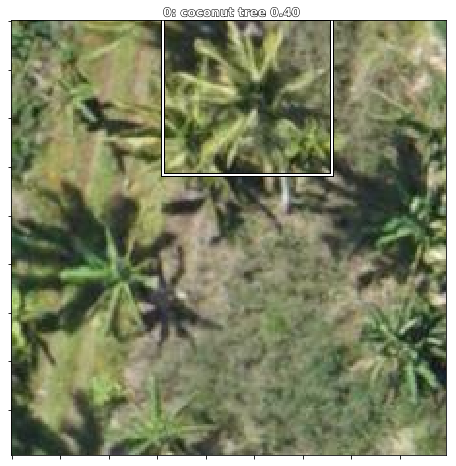

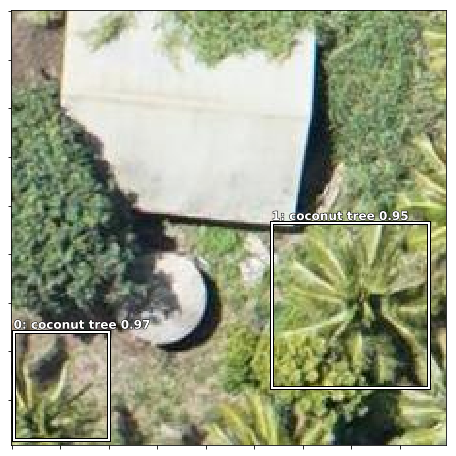

...

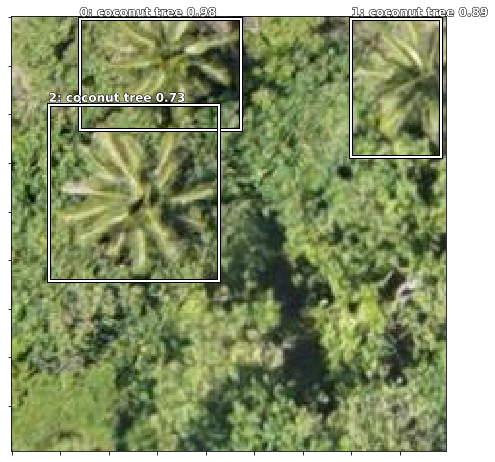

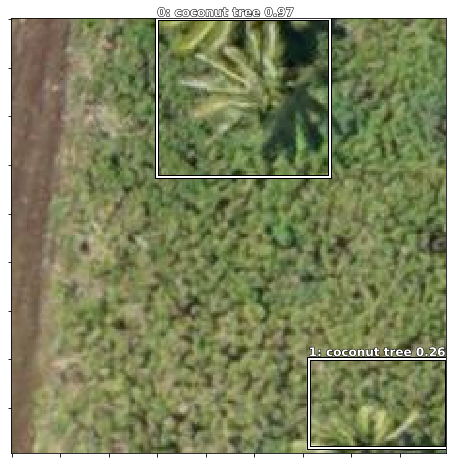

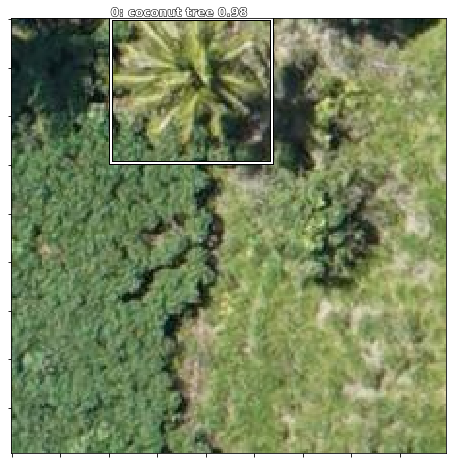

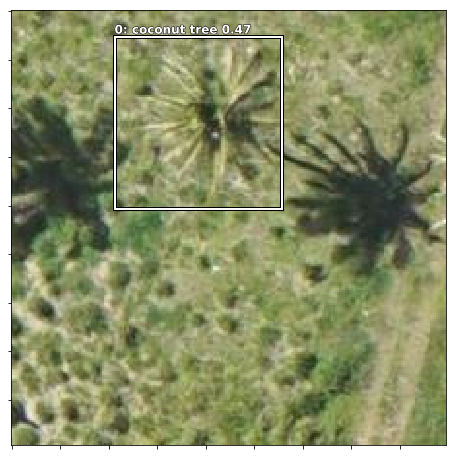

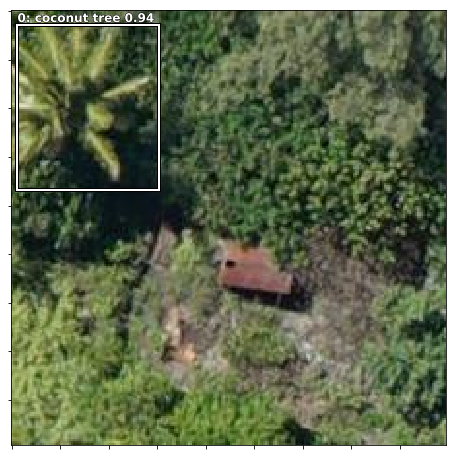

In [336]:
for i in range(30): 
    show_nmf(i)
    